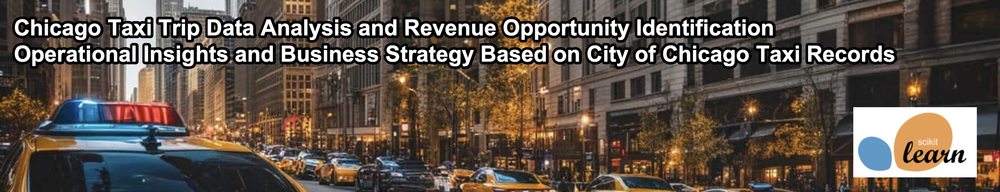

## Case Background

A Chicago taxi company has hired your small accounting and consulting firm to help them shave costs and increase revenues. Like many traditional cab companies, Yellow Cab is feeling significant pressure from ride-hailing companies like Lyft and Uber. 

The Chicago Taxi company client tells you: "I heard that you have some data analytics skills. I would like you to see if you there is any data out there that might help us learn more about the situation taxis are in and if there are any interesting revenue opportunities out there that we have not thought of. Where should we be focusing their efforts?"

Taxi cabs in Chicago, Illinois, are operated by private companies and licensed by the city. There are about seven thousand licensed cabs operating within the city limits. Licenses are obtained through the purchase or lease of a taxi medallion which is then affixed to the top right hood of the car.The city of Chicago puts a bunch of data out there about cab trips. This is just what you need!
 
You may find more information about the data here: https://data.cityofchicago.org/Transportation/Taxi-Trips/wrvz-psew 


Data explanation: Taxi trips reported to the City of Chicago in its role as a regulatory agency. To protect privacy but allow for aggregate analyses, the Taxi ID is consistent for any given taxi medallion number but does not show the number, Census Tracts are suppressed in some cases, and times are rounded to the nearest 15 minutes.

## Load Relevant Packages and Dependencies

Set up the environment, load packages and dependencies.

In [24]:
import pandas as pd 
import numpy as np 
# to show graphs inline
%matplotlib inline

In [25]:
pd.set_option('display.max_column', None)

In [26]:
file = 'Taxi_Trips_october.csv'
# Load data for use
df = pd.read_csv(file)

In [27]:
df['Date'] = pd.to_datetime(df['Trip Start Timestamp']) # If your Date column is of the type object otherwise skip this
date_range = str(df['Date'].dt.date.min()) + ' to ' +str(df['Date'].dt.date.max())
date_range

/var/folders/xf/4sdwstz12kv6j1twjsxj9dz80000gn/T/ipykernel_80510/3733559165.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Date'] = pd.to_datetime(df['Trip Start Timestamp']) # If your Date column is of the type object otherwise skip this


'2023-10-01 to 2023-11-01'

In [28]:
df.columns

Index(['Trip ID', 'Taxi ID', 'Trip Start Timestamp', 'Trip End Timestamp',
       'Trip Seconds', 'Trip Miles', 'Pickup Census Tract',
       'Dropoff Census Tract', 'Pickup Community Area',
       'Dropoff Community Area', 'Fare', 'Tips', 'Tolls', 'Extras',
       'Trip Total', 'Payment Type', 'Company', 'Pickup Centroid Latitude',
       'Pickup Centroid Longitude', 'Pickup Centroid Location',
       'Dropoff Centroid Latitude', 'Dropoff Centroid Longitude',
       'Dropoff Centroid  Location', 'Community Areas', 'Date'],
      dtype='object')

Columns :

    unique_key - Unique identifier for the trip.
    taxi_id - A unique identifier for the taxi.
    trip_start_timestamp - When the trip started, rounded to the nearest 15 minutes.
    trip_end_timestamp - When the trip ended, rounded to the nearest 15 minutes.
    trip_seconds - Time of the trip in seconds.
    trip_miles - Distance of the trip in miles.
    pickup_census_tract - The Census Tract where the trip began. For privacy, this Census Tract is not shown for some trips.
    dropoff_census_tract - The Census Tract where the trip ended. For privacy, this Census Tract is not shown for some trips.
    pickup_community_area - The Community Area where the trip began.
    dropoff_community_area - The Community Area where the trip ended.
    fare - The fare for the trip.
    tips - The tip for the trip. Cash tips generally will not be recorded.
    tolls - The tolls for the trip.
    extras - Extra charges for the trip.
    trip_total - Total cost of the trip, the total of the fare, tips, tolls, and extras.
    payment_type - Type of payment for the trip.
    company - The taxi company.
    pickup_latitude - The latitude of the center of the pickup census tract or the community area if the census tract has been hidden for privacy.
    pickup_longitude - The longitude of the center of the pickup census tract or the community area if the census tract has been hidden for privacy.
    pickup_location - The location of the center of the pickup census tract or the community area if the census tract has been hidden for privacy.
    dropoff_latitude - The latitude of the center of the dropoff census tract or the community area if the census tract has been hidden for privacy.
    dropoff_longitude - The longitude of the center of the dropoff census tract or the community area if the census tract has been hidden for privacy.
    dropoff_location - The location of the center of the dropoff census tract or the community area if the census tract has been hidden for privacy.


## 1. Clean Data


Perform some data operations on the dataframe such that unreasonable trip rows are eliminated.
- Delete trips with NaN mileage and NaN seconds.
- Delete trips with no cost, since these are mistakes or uninteresting cases
- Delete trips with very low mileage but starting and stopping in a different community, since these are likely mistakes.
- Delete trips with no seconds but starting and stopping in a different community, since these are likely mistakes.

In [34]:
# Check for missing values in each column
df.isnull().sum()

Trip ID                            0
Taxi ID                            0
Trip Start Timestamp               0
Trip End Timestamp                 5
Trip Seconds                     130
Trip Miles                         3
Pickup Census Tract           304359
Dropoff Census Tract          313705
Pickup Community Area          15983
Dropoff Community Area         56279
Fare                            1528
Tips                            1528
Tolls                           1528
Extras                          1528
Trip Total                      1528
Payment Type                       0
Company                            0
Pickup Centroid Latitude       15774
Pickup Centroid Longitude      15774
Pickup Centroid Location       15774
Dropoff Centroid Latitude      52283
Dropoff Centroid Longitude     52283
Dropoff Centroid  Location     52283
Community Areas                15775
Date                               0
dtype: int64

In [35]:
# Delete trips with NaN mileage and NaN seconds.
df = df.dropna(subset=['Trip Miles', 'Trip Seconds'], how='any')

In [36]:
# Delete trips with no cost, since these are mistakes or uninteresting cases
df = df.loc[df['Trip Total'] > 0]

In [37]:
# Define custom percentiles
percentiles = [0.01, 0.1, 0.11 ,0.12, 0.13, 0.15, 0.25, 0.5, 0.75, 0.99]

# Get the summary of statistics including custom percentiles
df['Trip Miles'].describe(percentiles=percentiles)

count    588956.000000
mean          6.884779
std           7.788566
min           0.000000
1%            0.000000
10%           0.000000
11%           0.050000
12%           0.100000
13%           0.210000
15%           0.450000
25%           0.970000
50%           3.110000
75%          12.570000
99%          26.940000
max         913.100000
Name: Trip Miles, dtype: float64

In [38]:
# Delete trips with very low mileage but starting and stopping in a different community, since these are likely mistakes.
df.drop(df[(df['Trip Miles'] < 0.1) & (df['Pickup Community Area'] != df['Dropoff Community Area'])].index, inplace=True)

In [39]:
#Delete trips with no seconds but starting and stopping in a different community, since these are likely mistakes.
df.drop(df[(df['Trip Seconds'] == 0) & (df['Pickup Community Area'] != df['Dropoff Community Area'])].index, inplace=True)

In [40]:
df.describe()

,Trip Seconds,Trip Miles,Pickup Census Tract,Dropoff Census Tract,Pickup Community Area,Dropoff Community Area,Fare,Tips,Tolls,Extras,Trip Total,Pickup Centroid Latitude,Pickup Centroid Longitude,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Community Areas,Date
count,560433.000000,560433.000000,2.737840e+05,2.657070e+05,549605.000000,511837.000000,560433.000000,560433.000000,560433.000000,560433.000000,560433.000000,549643.000000,549643.000000,515533.000000,515533.000000,549642.00000,560433
mean,1329.715896,7.233700,1.703153e+10,1.703143e+10,37.266644,27.029744,23.663329,3.321976,0.070215,2.446452,29.714441,41.903767,-87.707911,41.894637,-87.665685,46.72733,2023-10-16 09:07:28.269641984
min,0.000000,0.000000,1.703101e+10,1.703101e+10,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.010000,41.650222,-87.913625,41.660136,-87.913625,1.00000,2023-10-01 23:45:00
25%,502.000000,1.100000,1.703108e+10,1.703108e+10,8.000000,8.000000,8.750000,0.000000,0.000000,0.000000,10.750000,41.878866,-87.769615,41.878866,-87.663518,37.00000,2023-10-09 05:45:00
50%,1020.000000,3.590000,1.703132e+10,1.703132e+10,32.000000,28.000000,17.670000,2.000000,0.000000,0.000000,21.000000,41.895033,-87.642649,41.892073,-87.633308,38.00000,2023-10-16 09:15:00
75%,1916.000000,12.990000,1.703198e+10,1.703184e+10,76.000000,32.000000,37.750000,5.050000,0.000000,4.000000,47.810000,41.979071,-87.625192,41.922686,-87.624135,75.00000,2023-10-23 19:30:00
max,86230.000000,913.100000,1.703198e+10,1.703198e+10,77.000000,77.000000,900.000000,115.000000,5555.550000,7760.470000,8900.630000,42.016046,-87.534903,42.015934,-87.534903,77.00000,2023-11-01 00:00:00
std,1640.514584,7.811061,3.771371e+05,3.501742e+05,26.613973,21.495165,18.588526,4.469536,13.124724,22.486328,38.265159,0.063278,0.118015,0.056489,0.078861,19.52626,NaN


In [41]:
# Check for duplicated rows
df.duplicated().sum()

0

### Fix datetime

Create a new column that converts `trip_start_timestamp` and `trip_end_timestamp` to a datetime object. Create two new columns - for the  day and hour, use the start of the trip, since that is something the taxi driver can control)

In [44]:
# Convert trip_start_timestamp and trip_end_timestamp to datetime objects
df['Trip Start Timestamp'] = pd.to_datetime(df['Trip Start Timestamp'])
df['Trip End Timestamp'] = pd.to_datetime(df['Trip End Timestamp'])

# Create new columns for the day and hour using the trip start timestamp
df['Trip Start Day'] = df['Trip Start Timestamp'].dt.date
df['Trip Start Hour'] = df['Trip Start Timestamp'].dt.hour

# Verify the changes
df[['Trip Start Timestamp', 'Trip Start Day', 'Trip Start Hour']]

/var/folders/xf/4sdwstz12kv6j1twjsxj9dz80000gn/T/ipykernel_80510/3859599425.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Trip Start Timestamp'] = pd.to_datetime(df['Trip Start Timestamp'])


,Trip Start Timestamp,Trip Start Day,Trip Start Hour
0,2023-11-01 00:00:00,2023-11-01,0
1,2023-11-01 00:00:00,2023-11-01,0
2,2023-11-01 00:00:00,2023-11-01,0
3,2023-11-01 00:00:00,2023-11-01,0
4,2023-11-01 00:00:00,2023-11-01,0
...,...,...,...
591017,2023-10-01 23:45:00,2023-10-01,23
591018,2023-10-01 23:45:00,2023-10-01,23
591019,2023-10-01 23:45:00,2023-10-01,23
591020,2023-10-01 23:45:00,2023-10-01,23


### Deal with outliers

The main focus in outliers is getting `trip_total` right, since you are trying to understand how a company can make money. `trip_seconds` and `trip_duration` also have outliers, which you should look at, but we will focus on `trip_total` and `tips`.

First, draw box plots of those four variables to see how significant the outlier situation is

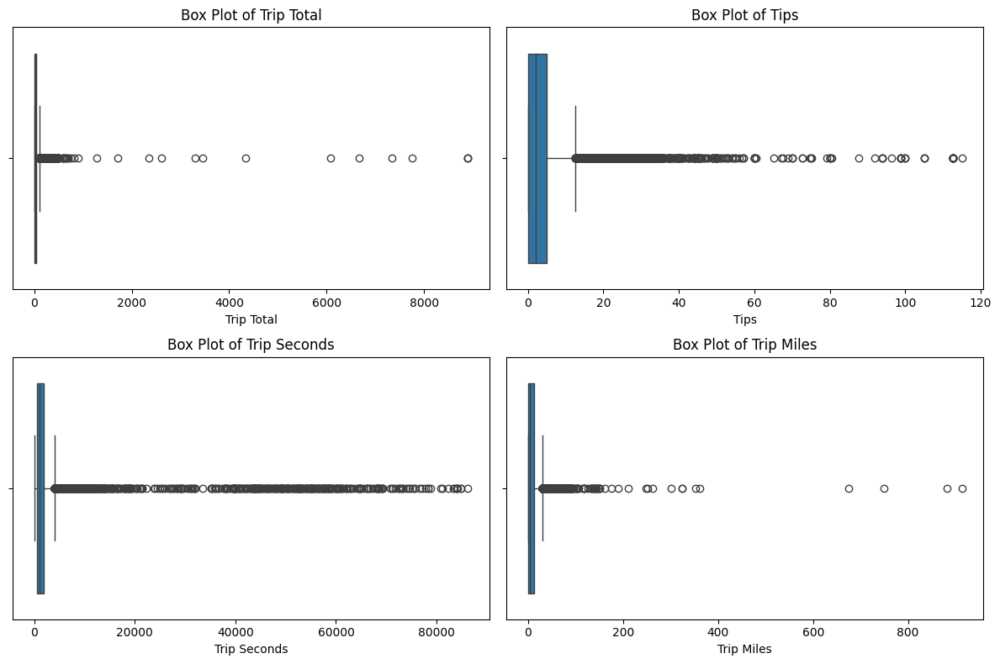

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up the plot
plt.figure(figsize=(12, 8))

# Subplots for each variable
variables = ['Trip Total', 'Tips', 'Trip Seconds', 'Trip Miles']
for i, var in enumerate(variables, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(x=df[var])
    plt.title(f"Box Plot of {var}")
    plt.xlabel(var)

plt.tight_layout()
plt.show()

Next, draw two scatter plots to see how cost and miles and cost and seconds relate to each other.

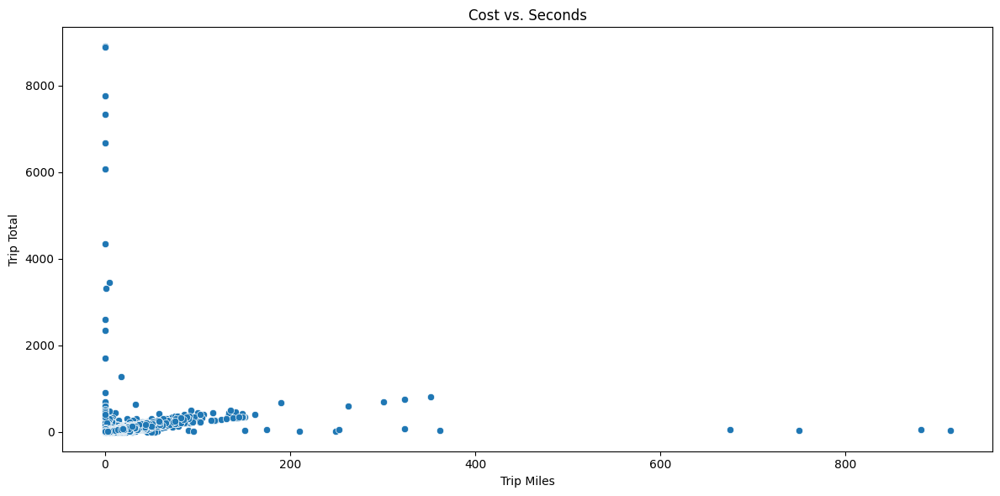

In [59]:
# Scatter plots
plt.figure(figsize=(12, 6))

sns.scatterplot(x=df['Trip Miles'], y=df['Trip Total'])
plt.title('Cost vs. Seconds')

plt.tight_layout()
plt.show()

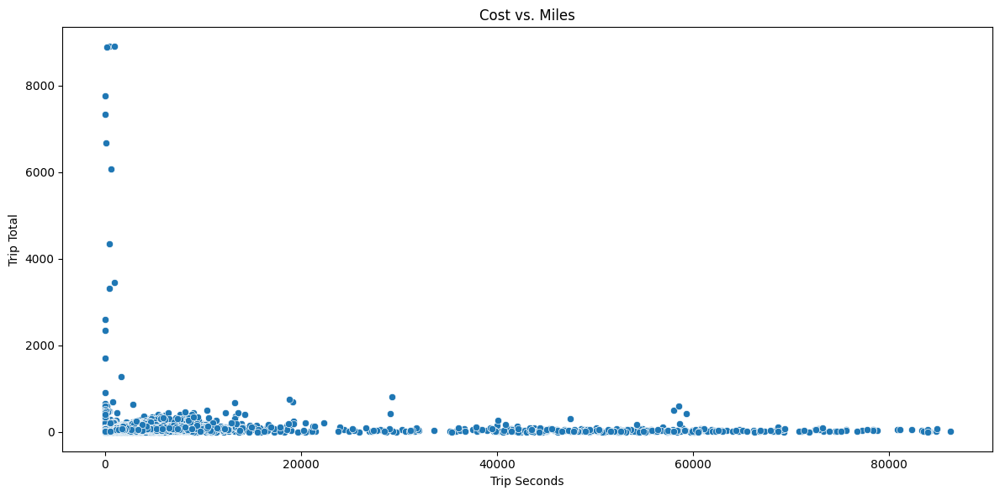

In [60]:
# Scatter plots
plt.figure(figsize=(12, 6))

sns.scatterplot(x=df['Trip Seconds'], y=df['Trip Total'])
plt.title('Cost vs. Miles')

plt.tight_layout()
plt.show()

Question: <br>
These plots indicate that most very high cost trips are probably errors or uninteresting since they have took very few seconds and went very few miles. For example, it does not seem plausible that a $8,000 cab fare took went about 0 miles and took about 0 seconds. 

Let's correct this by eliminating rows with unusually high dollars (i.e., trip with unreasonably low seconds or low mileage but high payment).

Assumption: We consider values not plausible if:

* Trip cost above 50 cents per second
* Trip costs above 50 dollar per mile
* Trip cost over 500 dollars for less than 10 miles
* Trip cost over 500 dollars for less than 10 minutes (600 seconds)

In [65]:
df['Cost_per_Second'] = df['Trip Total']/df['Trip Seconds']
df['Cost_per_Mile'] = df['Trip Total']/df['Trip Miles']

In [67]:
df.drop(df[(df['Cost_per_Mile'] > 50)].index, inplace=True)
df.drop(df[(df['Cost_per_Second'] > 0.5)].index, inplace=True)
#Other approach
df.drop(df[(df['Trip Total'] >= 500) & (df['Trip Miles'] < 10)].index, inplace=True)
df.drop(df[(df['Trip Total'] >= 500) & (df['Trip Seconds'] < 600)].index, inplace=True)

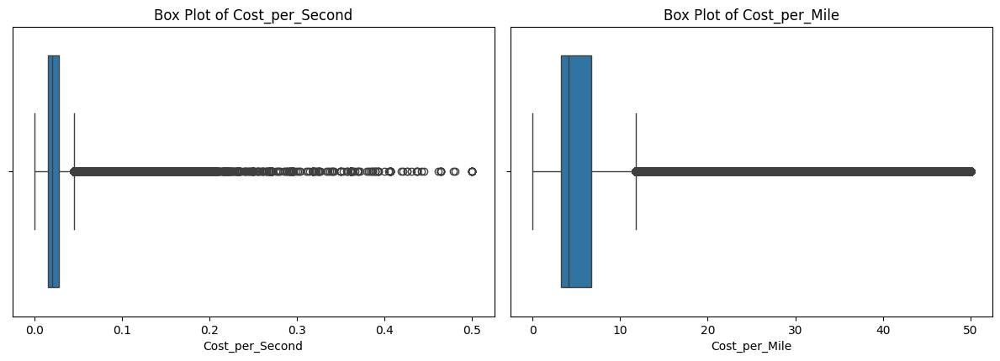

In [69]:
# Set up the plot
plt.figure(figsize=(12, 8))

# Subplots for each variable
variables = ['Cost_per_Second', 'Cost_per_Mile']
for i, var in enumerate(variables, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(x=df[var])
    plt.title(f"Box Plot of {var}")
    plt.xlabel(var)

plt.tight_layout()
plt.show()

Next, rerun the two scatterplots from above to visually inspect whether this worked. 

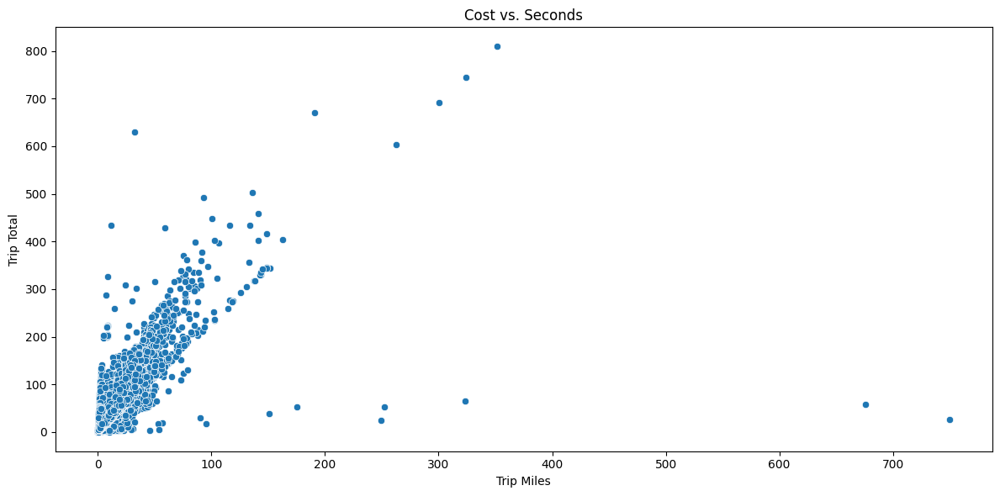

In [71]:
# Scatter plots
plt.figure(figsize=(12, 6))

sns.scatterplot(x=df['Trip Miles'], y=df['Trip Total'])
plt.title('Cost vs. Seconds')

plt.tight_layout()
plt.show()

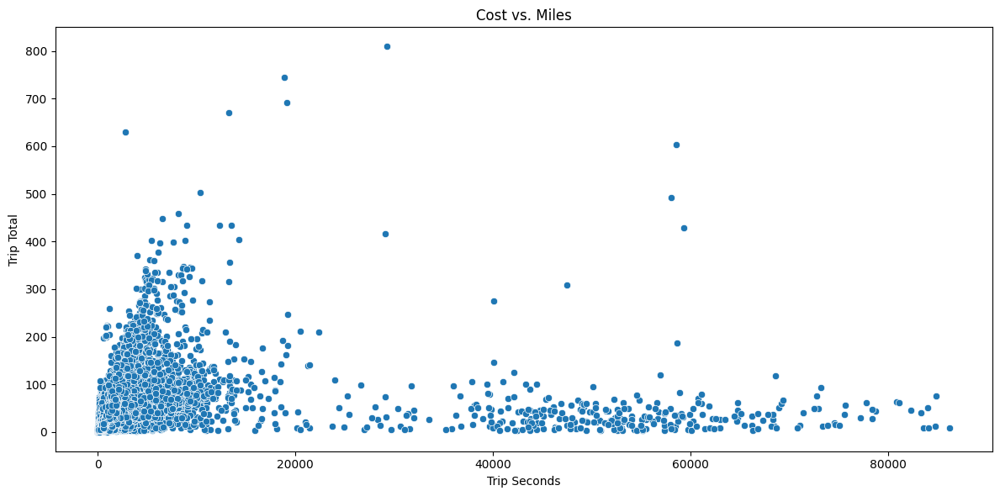

In [72]:
# Scatter plots
plt.figure(figsize=(12, 6))

sns.scatterplot(x=df['Trip Seconds'], y=df['Trip Total'])
plt.title('Cost vs. Miles')

plt.tight_layout()
plt.show()

## 2. Descriptive Analytics

Next, explore the data using descriptive analytics. Graph the number of trips by day of the week, and by hour of the day. 


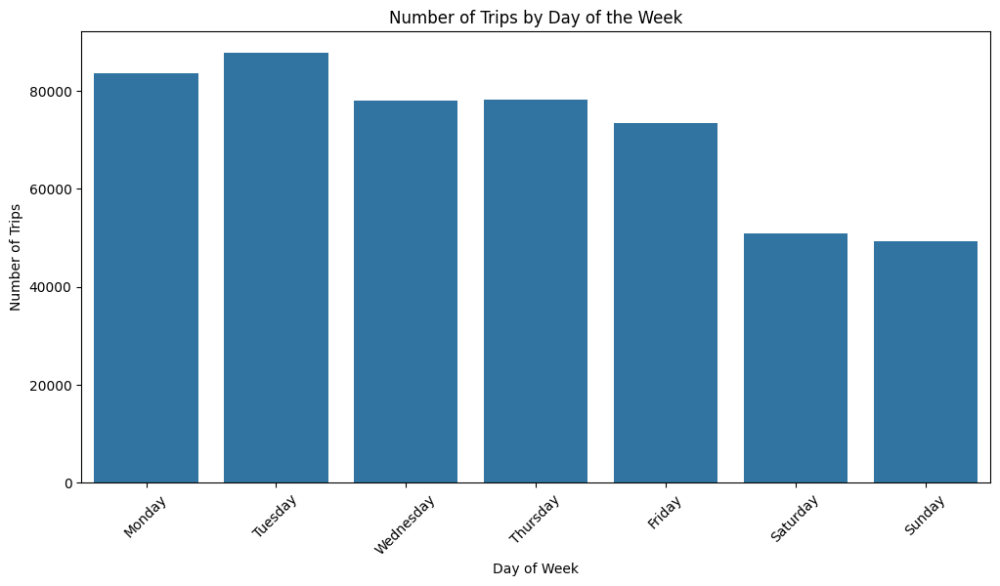

In [75]:
# Create new columns for day of the week and hour of the day
df['Day of Week'] = df['Trip Start Timestamp'].dt.day_name()
df['Hour of Day'] = df['Trip Start Hour']

# Plot trips by day of the week
plt.figure(figsize=(12, 6))
sns.countplot(x='Day of Week', data=df, order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.title('Number of Trips by Day of the Week')
plt.xlabel('Day of Week')
plt.ylabel('Number of Trips')
plt.xticks(rotation=45)
plt.show()

**Conclusion:** Taxis are taken more during working days.

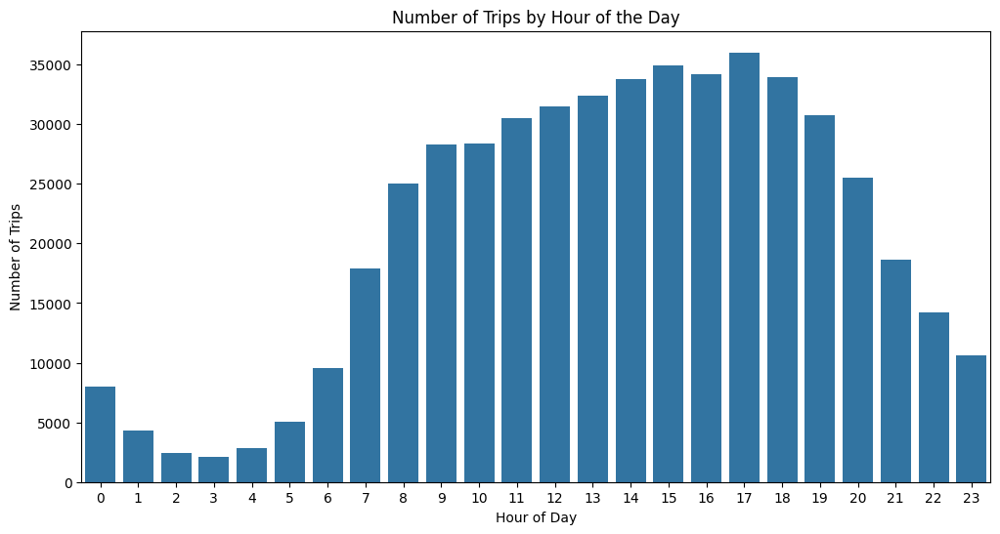

In [77]:
# Plot trips by hour of the day
plt.figure(figsize=(12, 6))
sns.countplot(x='Hour of Day', data=df, order=range(24))
plt.title('Number of Trips by Hour of the Day')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Trips')
plt.show()

**Conclusion:** From a time perspective taxis are mostly needed between 7-8am and 20-21pm

#### Costs and tips by pick-up community area

Graph on a histogram the top 20 community areas to pick up in if you want to maximize total cost and tips. Thus, two graphs are required. Can you draw any useful conclusions from this analysis?

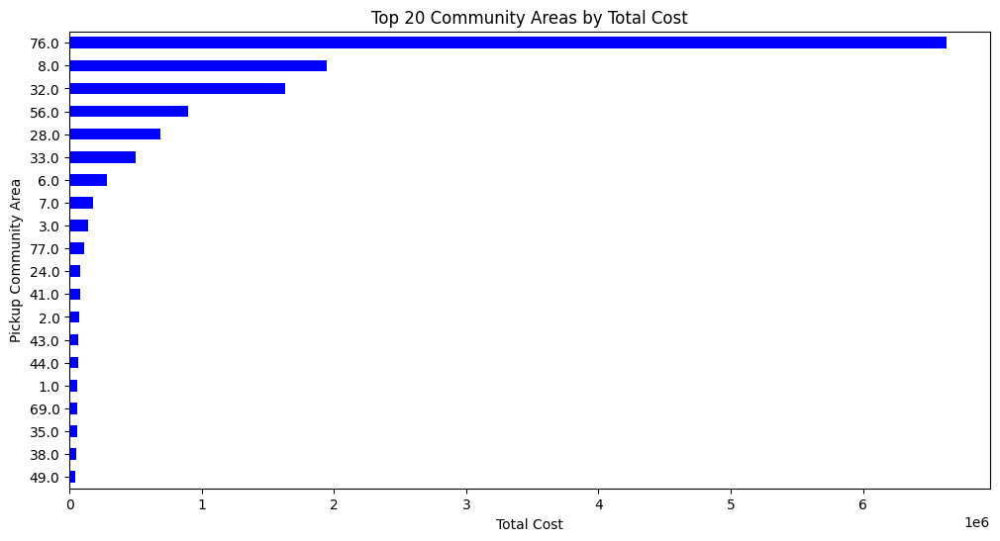

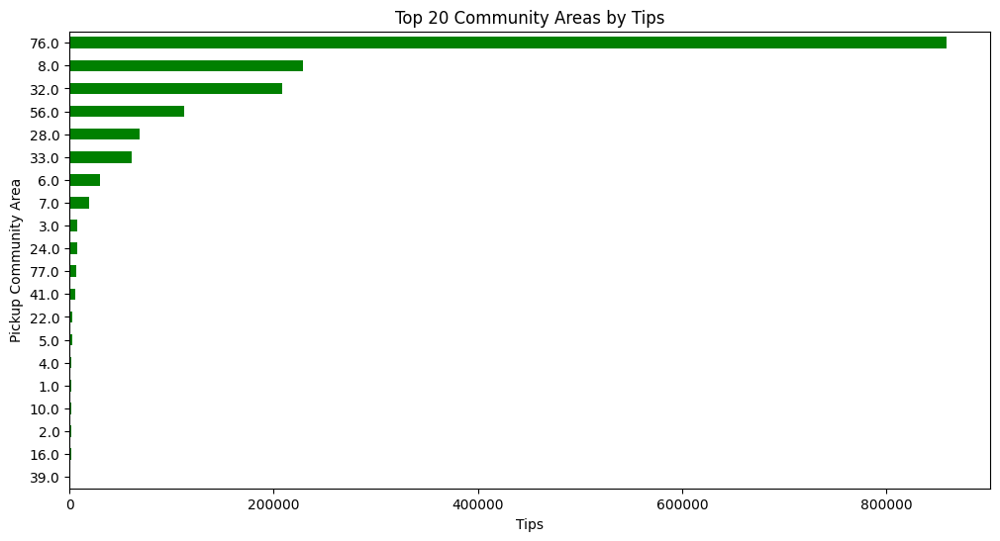

In [81]:
# Group by Pickup Community Area to sum up total cost and tips
top_20_cost_areas = df.groupby('Pickup Community Area')['Trip Total'].sum().nlargest(20)
top_20_tips_areas = df.groupby('Pickup Community Area')['Tips'].sum().nlargest(20)

# Plot histogram for top 20 community areas by total cost
plt.figure(figsize=(12, 6))
top_20_cost_areas.sort_values().plot(kind='barh', color='blue')
plt.title('Top 20 Community Areas by Total Cost')
plt.xlabel('Total Cost')
plt.ylabel('Pickup Community Area')
plt.show()

# Plot histogram for top 20 community areas by tips
plt.figure(figsize=(12, 6))
top_20_tips_areas.sort_values().plot(kind='barh', color='green')
plt.title('Top 20 Community Areas by Tips')
plt.xlabel('Tips')
plt.ylabel('Pickup Community Area')
plt.show()

**Conclusion:** There is a high correlation between Total cost of a trip and the tip.
The above mentioned areas the ones where people are picked-up the most by taxis (e.g. the city center or areas where a lot of people live and need a taxi). What is still not clear, if the distance of a trip contributes to this high revenue amount for the Top 20 community areaas

**Average Fare for each hour of every day over the week**

Graph a bar plot indicating the average fare for each hour of the 7 weekdays.

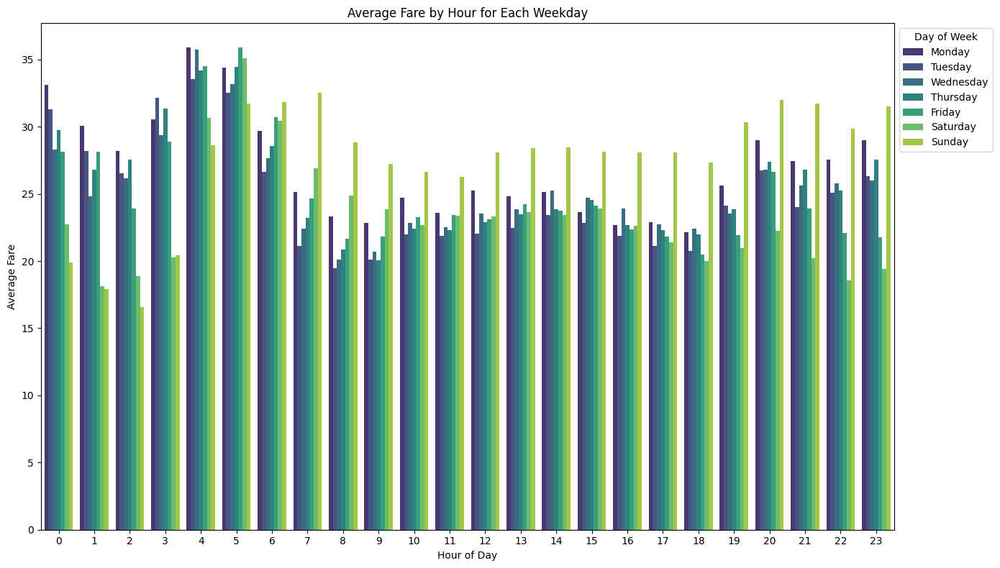

In [84]:
# Calculate average fare for each hour of the 7 weekdays
average_fare = df.groupby(['Day of Week', 'Hour of Day'])['Fare'].mean().reset_index()

# Set day of the week order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
average_fare['Day of Week'] = pd.Categorical(average_fare['Day of Week'], categories=day_order, ordered=True)

# Plot bar plot
plt.figure(figsize=(14, 8))
sns.barplot(data=average_fare, x='Hour of Day', y='Fare', hue='Day of Week', palette='viridis')
plt.title('Average Fare by Hour for Each Weekday')
plt.xlabel('Hour of Day')
plt.ylabel('Average Fare')
plt.legend(title='Day of Week', loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

**High Level Conclusion:**
- Sundays have in general a high fare (above 25) from 4am till midnight
- During working days (Monday - Friday) a high fare (above 25 with some exceptions) can be reached between midnight and 6-7am

#### Costs and tips by means of payment

Graph the mean of the total cost and tips by type of payment. Thus, two graphs are required. Can you draw any useful conclusions from this analysis?

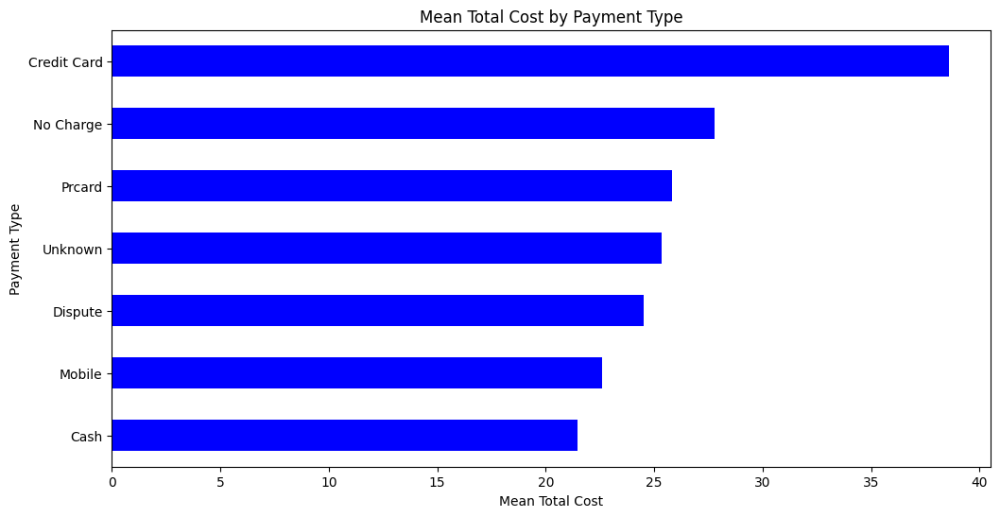

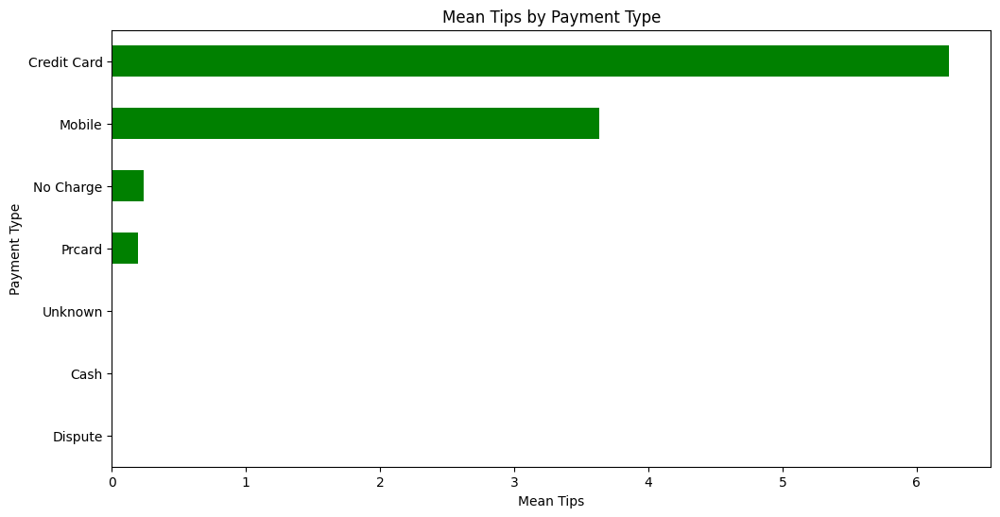

In [88]:
# Calculate mean of total cost and tips by type of payment
mean_cost_by_payment = df.groupby('Payment Type')['Trip Total'].mean().sort_values()
mean_tips_by_payment = df.groupby('Payment Type')['Tips'].mean().sort_values()

# Plot mean total cost by payment type
plt.figure(figsize=(12, 6))
mean_cost_by_payment.plot(kind='barh', color='blue')
plt.title('Mean Total Cost by Payment Type')
plt.xlabel('Mean Total Cost')
plt.ylabel('Payment Type')
plt.show()

# Plot mean tips by payment type
plt.figure(figsize=(12, 6))
mean_tips_by_payment.plot(kind='barh', color='green')
plt.title('Mean Tips by Payment Type')
plt.xlabel('Mean Tips')
plt.ylabel('Payment Type')
plt.show()

**Conclusion:**
- The highest total cost is reached by Credit Card payments
- Credit Card Tips and Mobile Tips have the highest amount with big difference

#### Visualizing tips and total bill by location

Next, explore some of the geographical characteristics of the data. Graph the data based upon latitude and longitude. Use the pick-up location, since this is something the driver can control. Use built in features of a Python package (e.g., pyplot from matplotlib) to also see the total bill and the tip amount on this graph. (Hint: outliers will skew the graph, look at trips under $50.) What conclusions can be drawn from this analysis?

**Extra**: If you are really advanced python user, you can try to overlay a Chicago city map and build a nice visualization tool

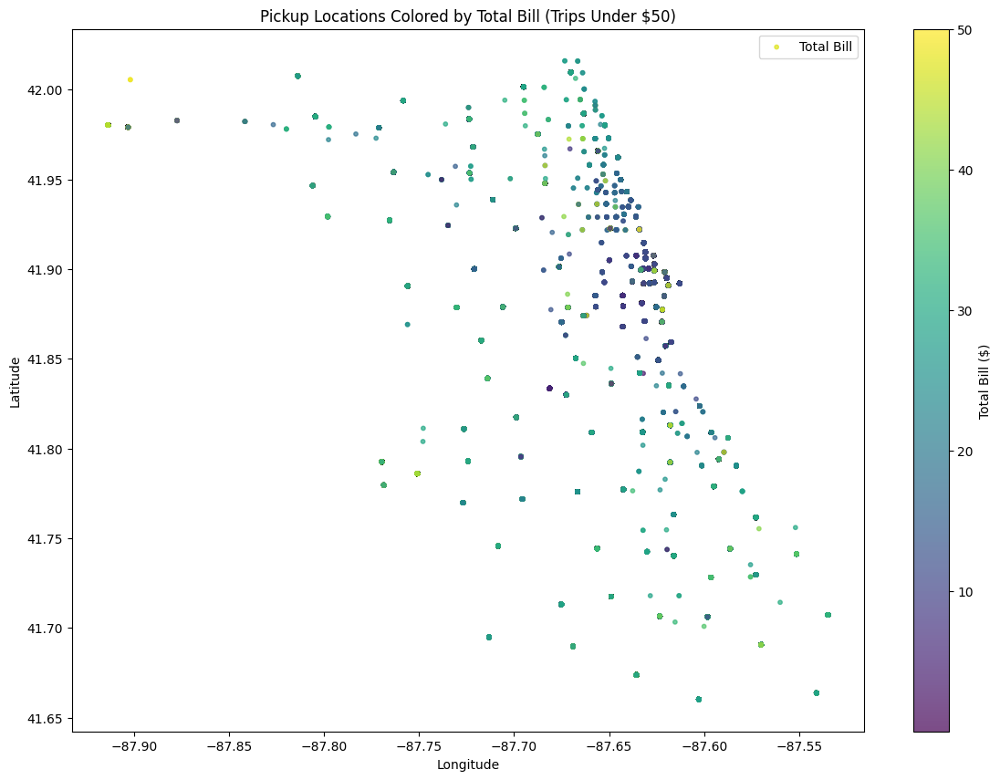

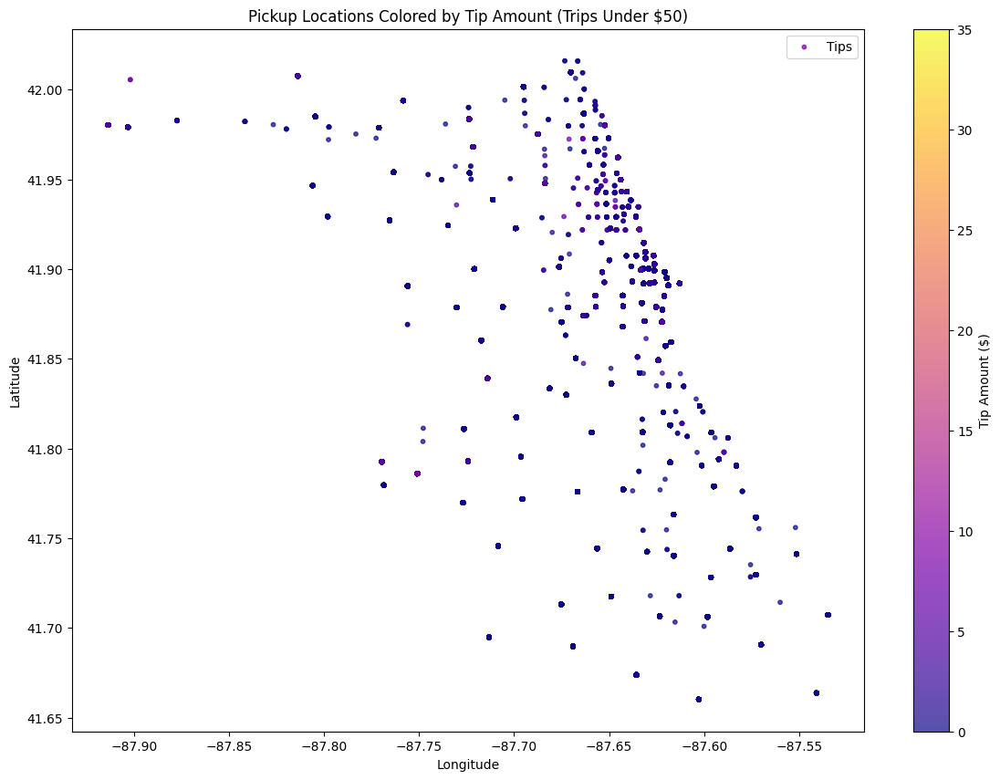

In [92]:
# Filter data to trips with total cost under $50 and Tips below 35
filtered_df = df[(df['Trip Total'] <= 50)]

# Set up the plot
plt.figure(figsize=(14, 10))

# Scatter plot for total bill
plt.scatter(filtered_df['Pickup Centroid Longitude'], filtered_df['Pickup Centroid Latitude'],
            c=filtered_df['Trip Total'], cmap='viridis', s=10, alpha=0.7, label='Total Bill')

plt.colorbar(label='Total Bill ($)')
plt.title('Pickup Locations Colored by Total Bill (Trips Under $50)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.show()

# Scatter plot for tips
plt.figure(figsize=(14, 10))
plt.scatter(filtered_df['Pickup Centroid Longitude'], filtered_df['Pickup Centroid Latitude'],
            c=filtered_df['Tips'], cmap='plasma', s=10, alpha=0.7, label='Tips')

plt.colorbar(label='Tip Amount ($)')
plt.title('Pickup Locations Colored by Tip Amount (Trips Under $50)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.show()

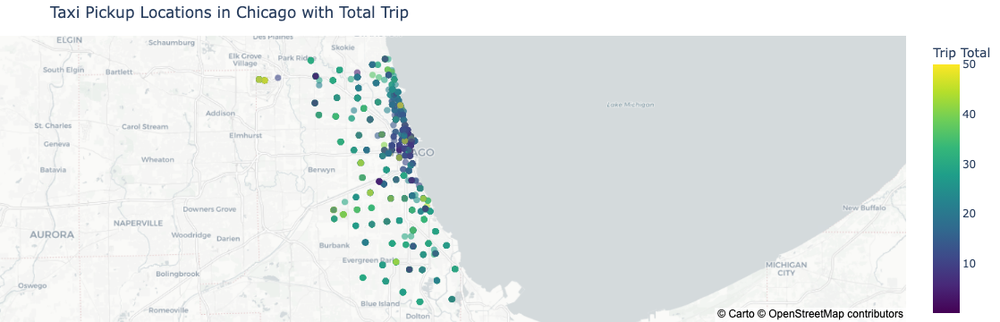

In [93]:
import plotly.express as px

# Limit the number of data points to avoid rendering too many
df_sampled = filtered_df.sample(n=50000, random_state=42)

# Create the Plotly map with scatter points
fig = px.scatter_mapbox(df_sampled, 
                        lat='Pickup Centroid Latitude', 
                        lon='Pickup Centroid Longitude', 
                        color='Trip Total', 
                        size='Tips', 
                        hover_data=['Trip Total', 'Tips'], 
                        color_continuous_scale='Viridis', 
                        title='Taxi Pickup Locations in Chicago with Total Trip')

# Set the map style to 'carto-positron' for better performance (lighter map style)
fig.update_layout(mapbox_style="carto-positron",
                  mapbox_center={"lat": 41.88, "lon": -87.62},  # Center the map on Chicago
                  mapbox_zoom=10,  # Adjust zoom level for better view
                  margin={"r":0,"t":40,"l":0,"b":0},  # Adjust margins for better view
                  showlegend=False)

# Explicitly define the size of the points to ensure visibility
fig.update_traces(marker=dict(size=8, opacity=0.6))

# Manually render the plot (to avoid auto-render causing issues)
fig.show()


## 3. Predictive Analytics - Regression
----------

Accurate predictions will help taxi companies in making dynamic pricing adjustments based on various factors like demand, time of day, and trip distance.



With data points available for certain values, we can build a more general predictive model using linear regression ($y = A_0x_+\epsilon$). A linear regression model makes a few key assumptions:

- Features are linearly independent of each other.
- Errors in the regression are normally distributed (rather than biased).
- Effects are linear functions of inputs.


The model $y$ is an effect or response produced by the features, the predictors, or the values (all meaning more or less the same thing to us). If only one feature $x_1$ is used, this is a simple linear regression; if more than one feature is used, as above, then this is a multiple linear regression. Linear regression is actually implemented several times in Python libraries


**Exercise** Use a linear regression to examine the factors that are predictive of the *total trip cost*. What does this analysis tell you? Is there any non-linear relationships that you can identify? ( which will require going beyond a simple linear regression)


- As feature selection plays a vital role in building suitable and efficient algorithms. Describe the strategy you used. What features did you remove? What features did you modify? Use a linear regression and correlation analysis to inform you about the predictive skill of each feature on total trip cost.

- Remember that multicollinearity occurs when predictor variables in a regression model are highly correlated, leading to instability in estimation. Is there any multicolinearity in the dataset

### 3.1 Select relevant features

In [146]:
numerical_features = [
    "Trip Seconds", "Trip Miles", "Fare", "Tips", "Tolls", 
    "Extras"]
    
target_feature = "Trip Total"

df_features = df[numerical_features + [target_feature]]

### 3.2 Correlation Matrix

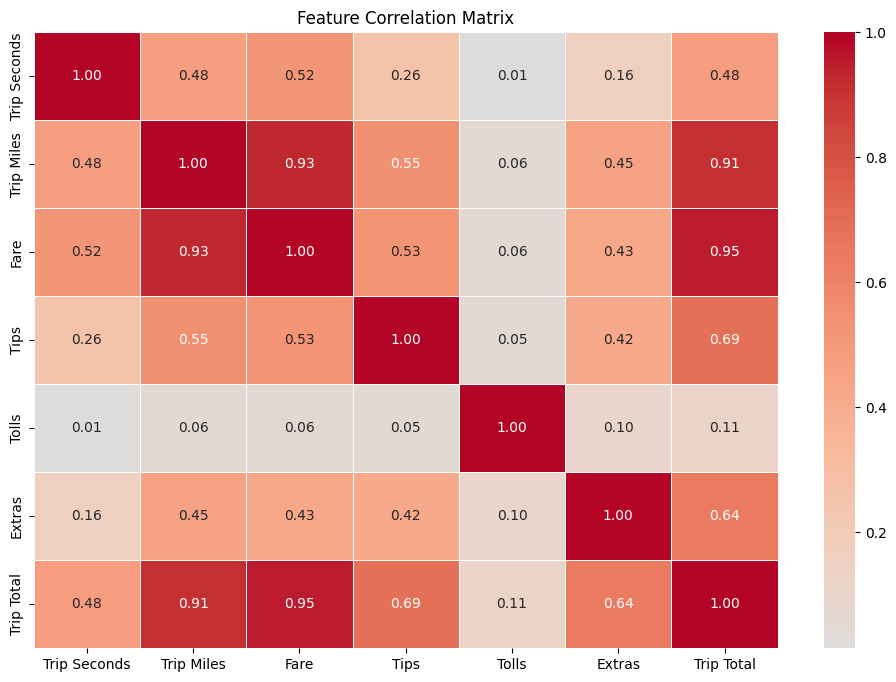

In [148]:
correlation_matrix = df_features.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, linewidths=0.5, fmt=".2f")
plt.title('Feature Correlation Matrix')
plt.show()

* Fare has the highest correlation with Trip Total (0.95), followed by Trip Miles (0.91) and Trip Seconds (0.48).
* Tips also shows a moderate positive correlation with Trip Total (0.69), suggesting that tips contribute to the total trip cost.
* Extras show medium correlations with Trip Total (0.64) and Tools show weak correlations with Trip Total (0.11). The weak correlation with tolls suggests that tolls contribute less consistently to the overall cost, while Extras seem to be more sporadic but still relevant.

### 3.3 Pairplots

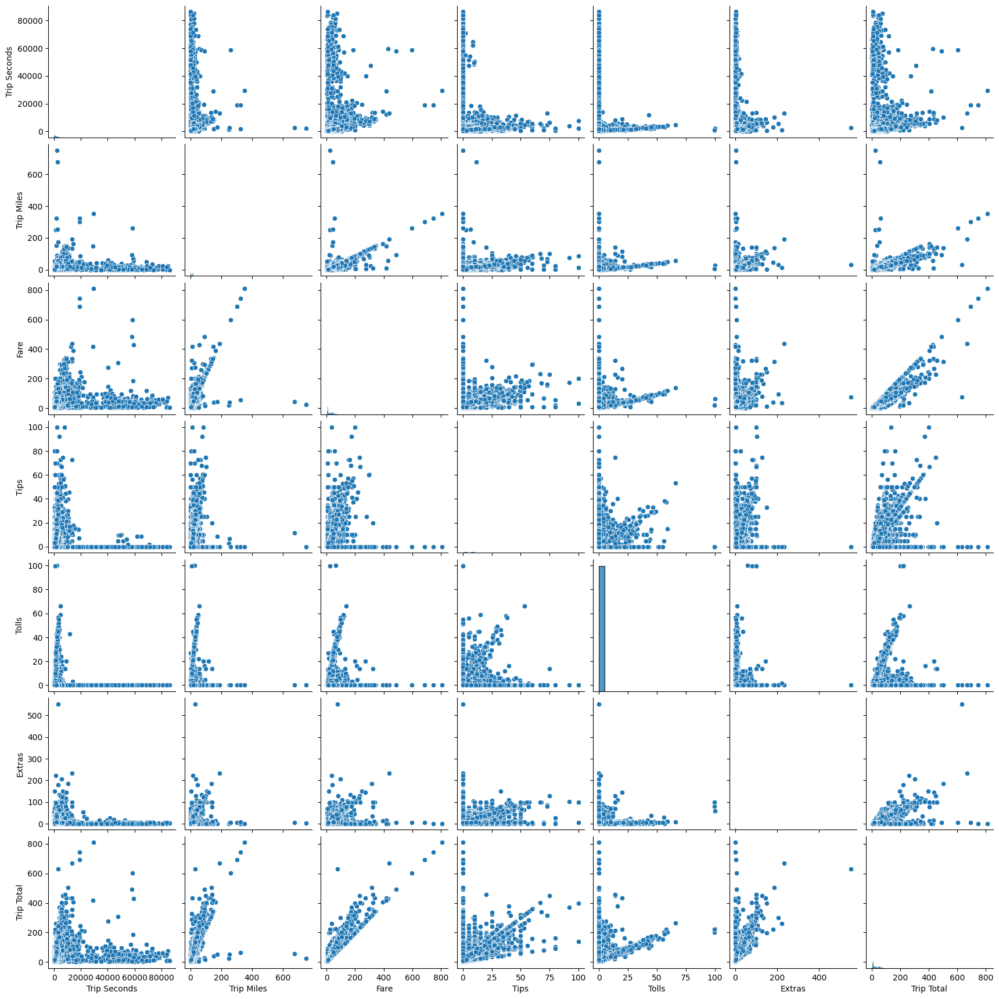

In [128]:
# Display Pairplots
sns.pairplot(df_features)
plt.show()

Based on the scatter plots and correlation matrix, it is clear that not all relationships between predictors and Trip Total are linear. Key observations include:

* Trip Seconds and Trip Total: The relationship is not linear, with a diminishing return effect for longer trips. The increase in trip cost becomes less significant as trip duration increases.
* Trip Miles and Trip Total: Similarly, longer trips tend to have a more moderate increase in total cost, suggesting that a linear model might not capture all of this relationship.
* Tips and Trip Total: Though moderately correlated, there is a skew with many trips having no tips. The relationship between Tips and Trip Total might require a model that accounts for the presence of tips (e.g., zero-inflated models).
* Extras and Trip Total: The Extras feature also shows non-linear behavior, with a significant portion of trips having no extra charges, and others showing a larger impact on total cost.

### 3.4 Multicollinearity Assessment

In [158]:
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = df[numerical_features]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

vif_data = pd.DataFrame()
vif_data["Feature"] = numerical_features
vif_data["VIF"] = [variance_inflation_factor(X_scaled, i) for i in range(X_scaled.shape[1])]

vif_data

,Feature,VIF
0,Trip Seconds,1.376897
1,Trip Miles,7.687388
2,Fare,7.789560
3,Tips,1.510736
4,Tolls,1.009893
5,Extras,1.339500


- From the correlation matrix, it is clear that Fare and Trip Miles are highly correlated and with the VIF results of 7.79 for Fares and 7.69 for Trip Miles, this may indicate multicollinearity.

### 3.5 Feature Selection

#### 3.5.1 Feature Modification for Trip Miles and Fare or Prioritization of one Feature above the other

- First, we look at the correlation matrix to identify highly correlated features. Strong correlations (e.g., Fare and Trip Miles with Trip Total) indicate that these features will be important predictors in the model.
- To reduce multicoolineartiy we could introduce interaction terms, such as Trip Miles * Fare, which might capture the joint effect of these features on Trip Total
- Other solution could be to prioritize one over the other and e.g. retaining the Trip Miles as the Fare is dependent on it or Fare due to its stronger correlation with Trip Total.


#### 3.5.2 Feature Modification for Trip Seconds, Tips and Extras

- Log Transformation: For features like Trip Seconds, Tips, and Extras, we might apply logarithmic transformations (to handle their skewed distributions and reduce non-linearity)

#### 3.5.3 Removing Tolls

- Tolls showed weak correlation with Trip Total (0.11). This suggests that tolls have minimal predictive value for Trip Total. Given its weak correlation and potential lack of significant impact, we may consider removing it to improve model simplicity and reduce potential noise.

### 3.6 Linear Regression Trip Miles leading (instead of Fares because of Multicollinearity) and no Tolls

In [282]:
selected_features = [
    "Trip Seconds", "Trip Miles", "Tips", "Extras"]

In [284]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
# Step 5: Linear Regression
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    df[selected_features], df[target_feature], test_size=0.2, random_state=42
)

# Fit linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Evaluate model
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Linear Regression Performance:")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R-squared (R²): {r2:.2f}")

Linear Regression Performance:
Mean Squared Error (MSE): 32.24
R-squared (R²): 0.94


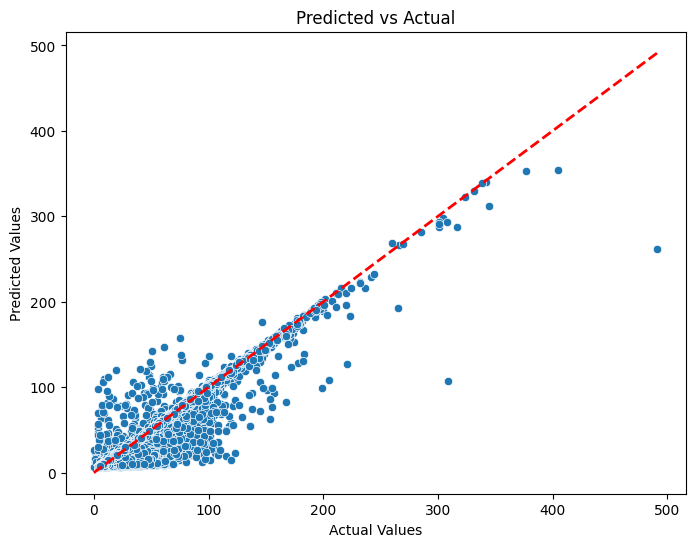

In [309]:
# Predicted vs Actual plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Predicted vs Actual")
plt.show()

### 3.7 Conclusion

Using linear regression, we find that Fare, Trip Miles, and Trip Seconds are strong predictors of Trip Total, while Tolls and Extras contribute less. However, non-linear relationships exist in several variables, suggesting that linear regression may not fully capture the underlying patterns. To improve the model, we need to consider transformations, interaction terms, and perhaps even more complex models like polynomial regression or machine learning algorithms that can capture non-linearity. Multicollinearity between features like Fare and Trip Miles is evident, which may lead to instability in the regression coefficients. Therefore, handling multicollinearity through feature selection or regularization is critical for building a stable and reliable model.

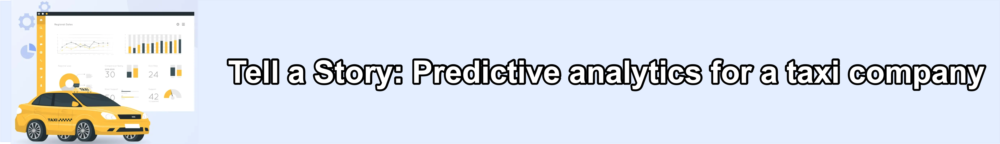

###  Extra: Tell a story

Finally, use the previous exploratory and predictive modeling analysis, to make recommendations to your supervisor from the Chicago taxi company client.


Consider alternative sources of data that could improve the prediction of total trip costs and drive revenue for that company. For example, imagine that you can have access to real forecast weather data, can that have an impact on your predictive skill? Be creative and enumerate alternative ways to improve the estimates.

#### 1. Problem statement

The Chicago Taxi Company faces increasing competition from ride-hailing platforms like Uber and Lyft. They have hired us to analyze their taxi trip data, identify predictive factors for trip costs, uncover new revenue opportunities, and recommend strategic actions to improve profitability. The company also seeks creative ideas for leveraging alternative data sources to refine trip cost predictions and optimize operations.

#### 2. Dynamic Pricing Strategy based on the time

Predictive models should be used to dynamically adjust fares based on the day and the time. Higher pricing should be introduced during high-demand periods (e.g., rush hours, major events).
Discounts should be offered or promotions during low-demand periods to increase ridership.

Based on the analysis we were able to identify that. It makes sense to offer taxi trips during the following periods:
- Sundays have in general a high fare (above 25) from 4am till midnight
- During working days (Monday - Friday) a high fare (above 25 with some exceptions) can be reached between midnight and 6-7am

#### 3. Optimized tip collection

As we saw in our analysis: Most of the tips were paid based on credit card as well as mobile payments.

Digital payment systems should be implemented that allow riders to easily add tips.
Tip suggestions should be in place (10%, 15%, 20%) in the payment interfaces.

#### 4. Extra Revenue Opportunity

Premium services like eco-friendly rides or luxury vehicle options should be introducedd to cater diverse customer preferences.

A part of the fleet can transition to EVs to reduce fuel costs and attract environmentally conscious customers.

#### 5. High-demand areas with shorter trips strategy

Encourage drivers to focus on high-demand areas where shorter, frequent trips occur, which are more profitable due to lower diminishing returns on distance-related fares.

Cabs should be positioned in areas where trips generate higher tips and extras.

#### 6. Alternative Data Sources

- Weather Data: E.g. Rainy and snowy weather increases the demand for taxis
- Traffic Data: E.g. Google Maps or other tools should be used to monitor traffic and optimize routes
- Event Data: To forecast surges in demand and dynamically adjust prices
- Competion Data: Uber and Lyft pricing should be monitored to attract customers which are more price sensitive
- Customer Feedback: After the payment/tips the customer should be asked digitally for feedback to gather new ideas or improvements

#### Conclusion

To stay competitive in a challenging market as a taxi company the company needs to adopt predictive analytics, optimize operations, and exploring innovative revenue streams. With that the company can reduce costs, increase revenues, and improve customer satisfaction.